# Download the data

In [ ]:
!wget https://he-public-data.s3.ap-southeast-1.amazonaws.com/dataset.zip

--2023-01-13 16:45:23--  https://he-public-data.s3.ap-southeast-1.amazonaws.com/dataset.zip
Resolving he-public-data.s3.ap-southeast-1.amazonaws.com (he-public-data.s3.ap-southeast-1.amazonaws.com)... 52.219.40.235
Connecting to he-public-data.s3.ap-southeast-1.amazonaws.com (he-public-data.s3.ap-southeast-1.amazonaws.com)|52.219.40.235|:443... connected.
HTTP request sent, awaiting response... 403 Forbidden
2023-01-13 16:45:24 ERROR 403: Forbidden.



In [ ]:
%ls .

ali_data@        dataset/  nady_data@    test_data/
annotations.xml  drive/    sample_data/  wget-log


In [ ]:
!cat wget-log

In [ ]:
!cp '/content/drive/MyDrive/Job_projects/For Fun/dataset.zip' ./

In [ ]:
!unzip -q /content/dataset.zip -d data

# Explore the dataset

In [ ]:
import matplotlib.pyplot as plt
import cv2
import pandas as pd
import random
import os 

print(random.randint(0,9))

0


(1080, 1920, 3)

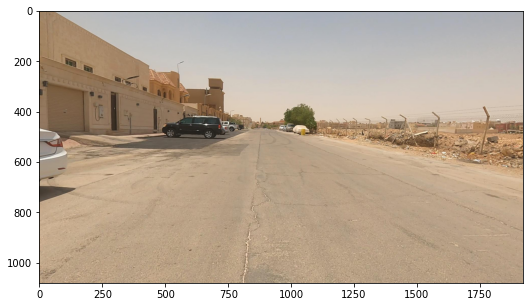

In [ ]:
plt.figure(figsize=(10,5))
plt.imshow(plt.imread('/content/dataset/images/4a48c42c9579ec0399e6c5a3e825e765.jpg'))
plt.imread('/content/dataset/images/4a48c42c9579ec0399e6c5a3e825e765.jpg').shape

## Read labels file

In [ ]:
labels_df = pd.read_csv('/content/data/dataset/train.csv')
labels_df.head()

,class,image_path,name,xmax,xmin,ymax,ymin
0,3.0,4a48c42c9579ec0399e6c5a3e825e765.jpg,GARBAGE,797.0,701.0,262.0,211.0
1,3.0,4a48c42c9579ec0399e6c5a3e825e765.jpg,GARBAGE,932.0,786.0,329.0,238.0
2,3.0,4a48c42c9579ec0399e6c5a3e825e765.jpg,GARBAGE,736.0,657.0,275.0,229.0
3,7.0,ea906a663da6321bcef78be4b7d1afff.jpg,BAD_BILLBOARD,986.0,786.0,136.0,0.0
4,8.0,1c7d48005a12d1b19261b8e71df7cafe.jpg,SAND_ON_ROAD,667.0,549.0,228.0,179.0


In [ ]:
labels_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19950 entries, 0 to 19949
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   class       19950 non-null  float64
 1   image_path  19950 non-null  object 
 2   name        19950 non-null  object 
 3   xmax        19950 non-null  float64
 4   xmin        19950 non-null  float64
 5   ymax        19950 non-null  float64
 6   ymin        19950 non-null  float64
dtypes: float64(5), object(2)
memory usage: 1.1+ MB


In [ ]:
labels_df['name'].unique()


array(['GARBAGE', 'BAD_BILLBOARD', 'SAND_ON_ROAD', 'GRAFFITI', 'POTHOLES',
       'CLUTTER_SIDEWALK', 'CONSTRUCTION_ROAD', 'BROKEN_SIGNAGE',
       'UNKEPT_FACADE', 'FADED_SIGNAGE', 'BAD_STREETLIGHT'], dtype=object)

In [ ]:
labels_df['class'].unique()

array([ 3.,  7.,  8.,  0.,  2.,  9.,  4.,  5., 10.,  1.,  6.])

In [ ]:
for i, v in zip(labels_df['class'].unique(), labels_df['name'].unique()):
    print(i, v)


3.0 GARBAGE
7.0 BAD_BILLBOARD
8.0 SAND_ON_ROAD
0.0 GRAFFITI
2.0 POTHOLES
9.0 CLUTTER_SIDEWALK
4.0 CONSTRUCTION_ROAD
5.0 BROKEN_SIGNAGE
10.0 UNKEPT_FACADE
1.0 FADED_SIGNAGE
6.0 BAD_STREETLIGHT


In [ ]:
gb_class = labels_df.groupby('name')['class'].count()
gb_class

name
BAD_BILLBOARD        1555
BAD_STREETLIGHT         1
BROKEN_SIGNAGE         83
CLUTTER_SIDEWALK     2253
CONSTRUCTION_ROAD    2730
FADED_SIGNAGE         107
GARBAGE              8597
GRAFFITI             1124
POTHOLES             2625
SAND_ON_ROAD          748
UNKEPT_FACADE         127
Name: class, dtype: int64

In [ ]:
print(gb_class.index)
gb_class.values

Index(['BAD_BILLBOARD', 'BAD_STREETLIGHT', 'BROKEN_SIGNAGE',
       'CLUTTER_SIDEWALK', 'CONSTRUCTION_ROAD', 'FADED_SIGNAGE', 'GARBAGE',
       'GRAFFITI', 'POTHOLES', 'SAND_ON_ROAD', 'UNKEPT_FACADE'],
      dtype='object', name='name')


array([1555,    1,   83, 2253, 2730,  107, 8597, 1124, 2625,  748,  127])

<BarContainer object of 11 artists>

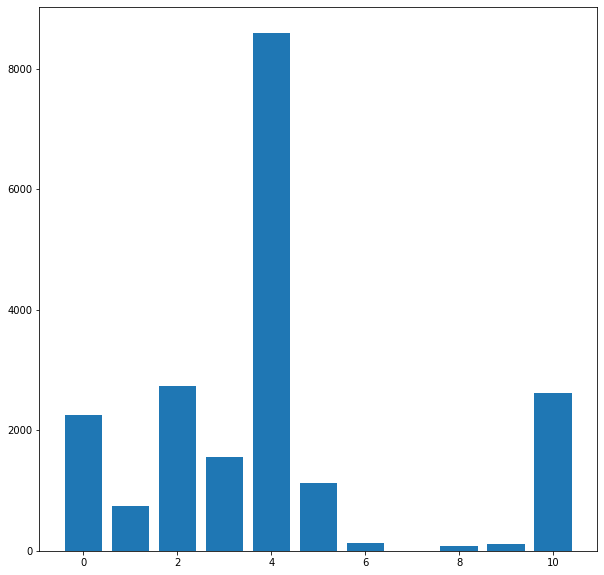

In [ ]:
plt.figure(figsize=(10,10))
plt.bar(labels_df['class'].unique(), gb_class)

In [ ]:
img = cv2.imread('/content/dataset/images/4a48c42c9579ec0399e6c5a3e825e765.jpg')
cv2.rectangle(img, (701*2, 211*2), (797*2, 262*2), (255,0,0), 5)


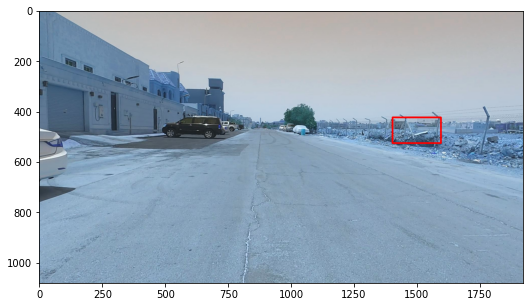

In [ ]:
plt.figure(figsize=(10,5))
plt.imshow(img)

In [ ]:
pd.DataFrame().to_dict()

{}

In [ ]:
for i, v in labels_df[labels_df['image_path'] == '006e04a34f54d116f6aff2bb31cb320c.jpg'][['xmax','xmin','ymax', 'ymin']].to_dict().items():
    print(i, v)

xmax {}
xmin {}
ymax {}
ymin {}


In [ ]:
labels_df[labels_df['name'] == 'BAD_STREETLIGHT']


,class,image_path,name,xmax,xmin,ymax,ymin
19353,6.0,53d3797457a0d2e3afe146e2f797e77e.jpg,BAD_STREETLIGHT,985.0,359.0,161.0,-47.0


In [ ]:
labels_df[labels_df['name'] == 'BROKEN_SIGNAGE']


,class,image_path,name,xmax,xmin,ymax,ymin
38,5.0,9ec0107501b37091e28853fafd3bec87.jpg,BROKEN_SIGNAGE,683.0,566.0,289.0,209.0
222,5.0,5b423ae5c1cf5a14010254b708f0203c.jpg,BROKEN_SIGNAGE,667.0,590.0,261.0,166.0
421,5.0,9b39d91113b05558b5213353a8d1331f.jpg,BROKEN_SIGNAGE,144.0,100.0,231.0,178.0
672,5.0,ac0e3cb82cae8d807c0b3a833832e2fd.jpg,BROKEN_SIGNAGE,794.0,557.0,502.0,236.0
674,5.0,0786f59294df93c29c945e0f370825ca.jpg,BROKEN_SIGNAGE,691.0,592.0,321.0,194.0
...,...,...,...,...,...,...,...
19030,5.0,efd244421e1289f868e5a7b4e17c9ce7.jpg,BROKEN_SIGNAGE,733.0,662.0,239.0,163.0
19099,5.0,7f43a0b1bc4a16ea8c131ecc65ca83d6.jpg,BROKEN_SIGNAGE,597.0,447.0,316.0,134.0
19100,5.0,7f43a0b1bc4a16ea8c131ecc65ca83d6.jpg,BROKEN_SIGNAGE,468.0,407.0,287.0,195.0
19101,5.0,7f43a0b1bc4a16ea8c131ecc65ca83d6.jpg,BROKEN_SIGNAGE,294.0,144.0,292.0,154.0


In [ ]:
labels_df[labels_df['name'] == 'UNKEPT_FACADE']


,class,image_path,name,xmax,xmin,ymax,ymin
173,10.0,522cafccf5576f5604a2652a0dcf722d.jpg,UNKEPT_FACADE,317.0,20.0,195.0,22.0
174,10.0,522cafccf5576f5604a2652a0dcf722d.jpg,UNKEPT_FACADE,942.0,540.0,176.0,28.0
220,10.0,f28ff3dc7b418d864d92851a01de2d27.jpg,UNKEPT_FACADE,907.0,501.0,287.0,150.0
221,10.0,f28ff3dc7b418d864d92851a01de2d27.jpg,UNKEPT_FACADE,634.0,165.0,269.0,150.0
288,10.0,08c362323b428a71eb83aecfca231473.jpg,UNKEPT_FACADE,1039.0,678.0,304.0,111.0
...,...,...,...,...,...,...,...
17905,10.0,f77555116ac63d569cca7dc15865f4a8.jpg,UNKEPT_FACADE,240.0,28.0,206.0,75.0
17906,10.0,f77555116ac63d569cca7dc15865f4a8.jpg,UNKEPT_FACADE,440.0,112.0,217.0,72.0
18994,10.0,adda6004228b263c5af6ccd7046d6f0f.jpg,UNKEPT_FACADE,114.0,-25.0,239.0,122.0
19077,10.0,6e26bbdf2627fbbd93205eafba363ae8.jpg,UNKEPT_FACADE,400.0,130.0,287.0,134.0


In [ ]:
def show_labels(img_path, edit_label = 2):
    labels_df = pd.read_csv('/content/dataset/train.csv')
    img_name = img_path.split('/')[-1]
    img_label = labels_df[labels_df['image_path'] == img_name][['xmax','xmin','ymax', 'ymin']]
    img = cv2.imread(img_path)
    for i in range(len(img_label)):
        cv2.rectangle(img, (abs(int(img_label['xmin'].iloc[i]* edit_label)), abs(int(img_label['ymin'].iloc[i]* edit_label))), 
                      (abs(int(img_label['xmax'].iloc[i]* edit_label)), abs(int(img_label['ymax'].iloc[i]* edit_label))),
                      (random.randint(0,255),random.randint(0,255), random.randint(150,255) ), 5)

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(15,10))
    plt.imshow(img)
    plt.show()
        



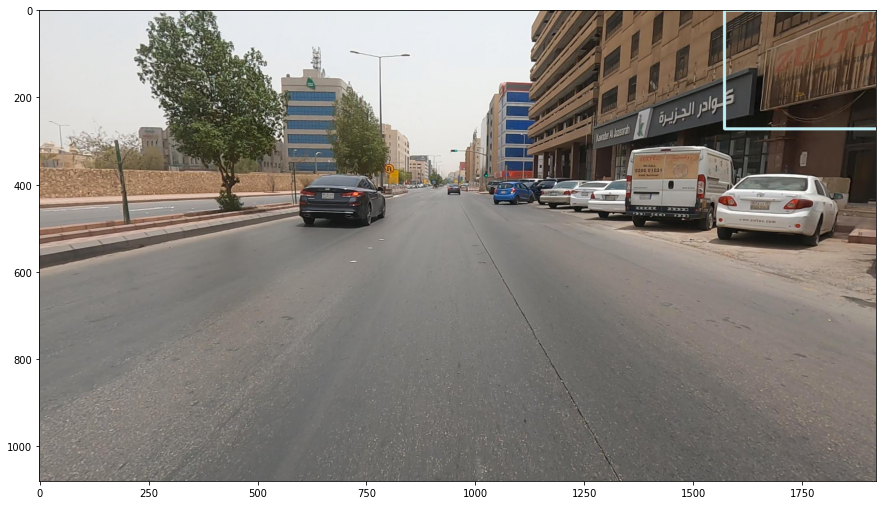

In [ ]:
show_labels('/content/dataset/images/ea906a663da6321bcef78be4b7d1afff.jpg')

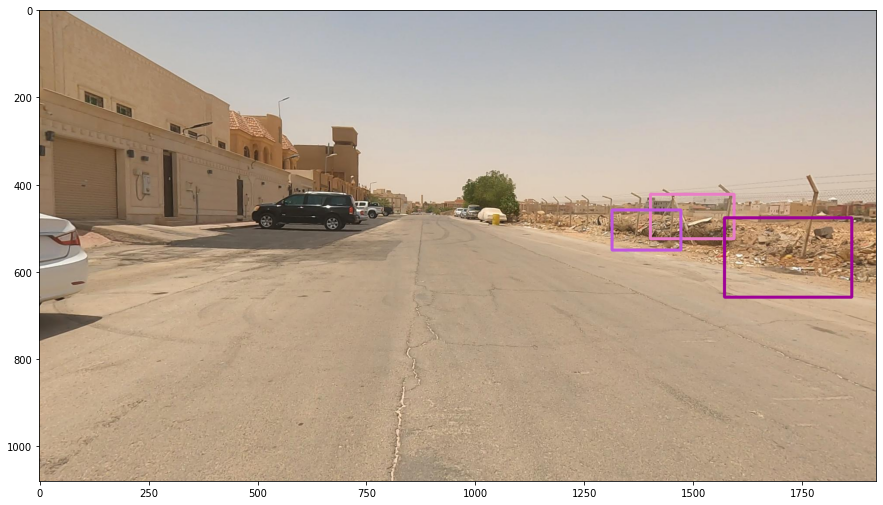

In [ ]:
show_labels('/content/dataset/images/4a48c42c9579ec0399e6c5a3e825e765.jpg')

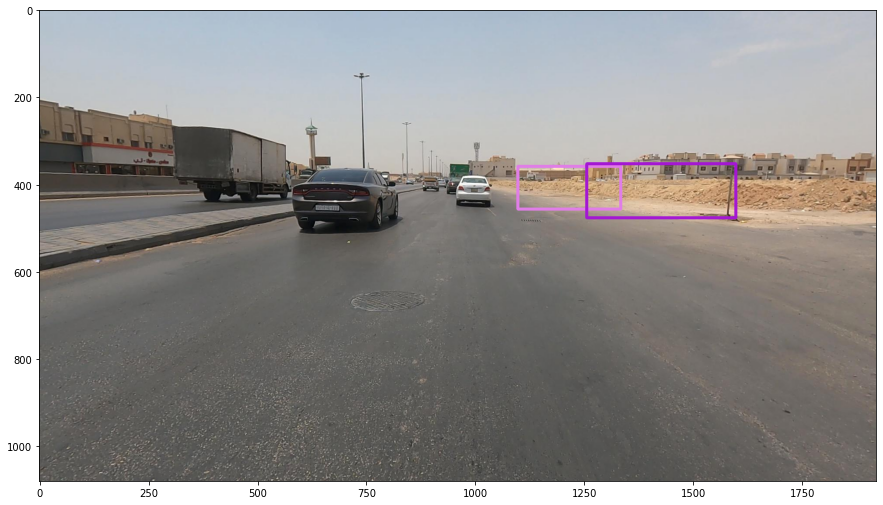

In [ ]:
show_labels('/content/dataset/images/1c7d48005a12d1b19261b8e71df7cafe.jpg')

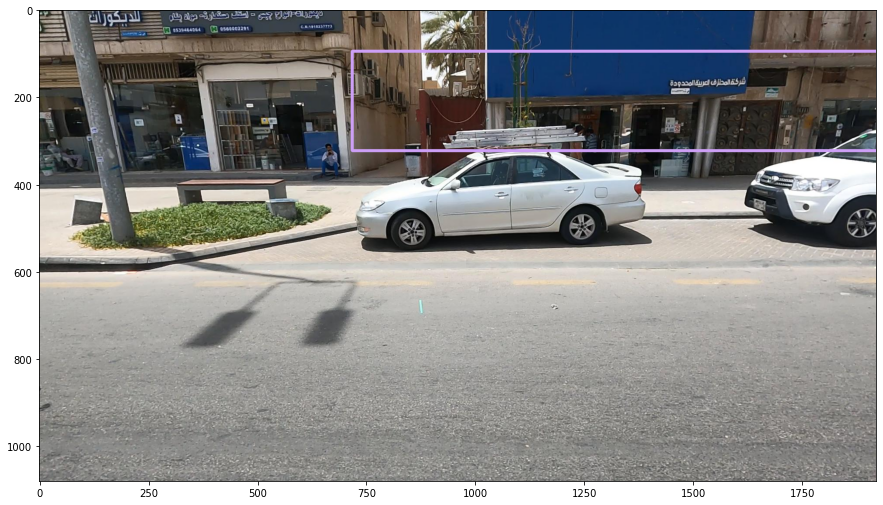

In [ ]:
show_labels('/content/dataset/images/53d3797457a0d2e3afe146e2f797e77e.jpg')

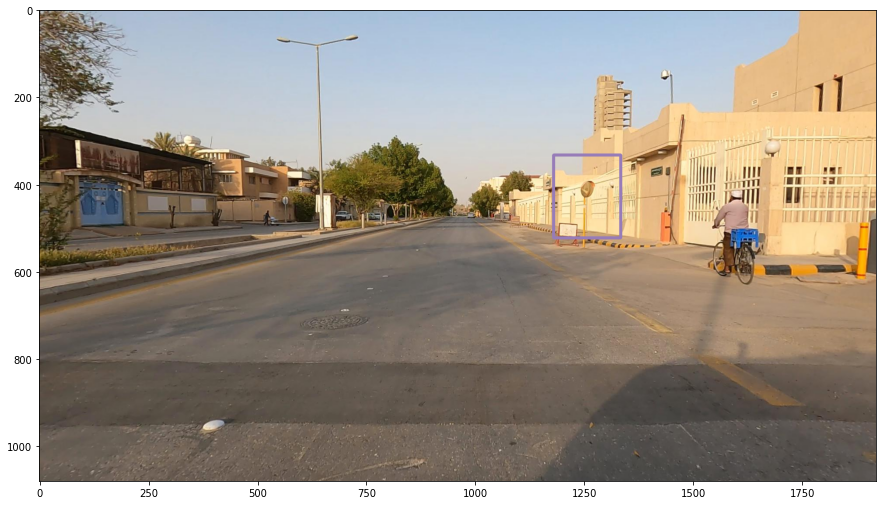

In [ ]:
show_labels('/content/dataset/images/5b423ae5c1cf5a14010254b708f0203c.jpg')

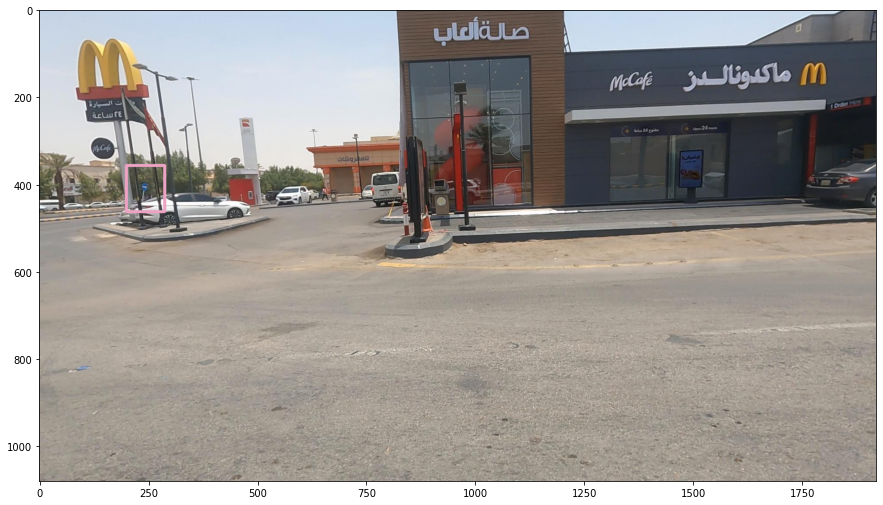

In [ ]:
show_labels('/content/dataset/images/9b39d91113b05558b5213353a8d1331f.jpg')


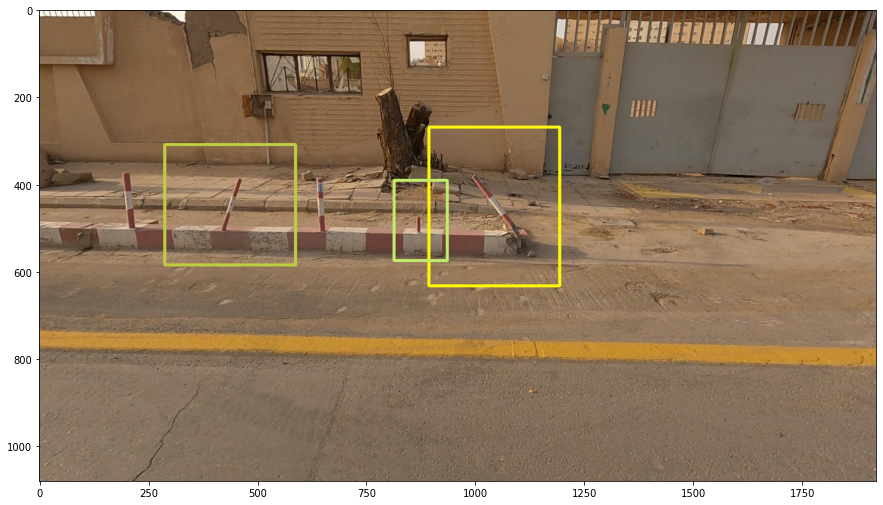

In [ ]:
show_labels('/content/dataset/images/7f43a0b1bc4a16ea8c131ecc65ca83d6.jpg')


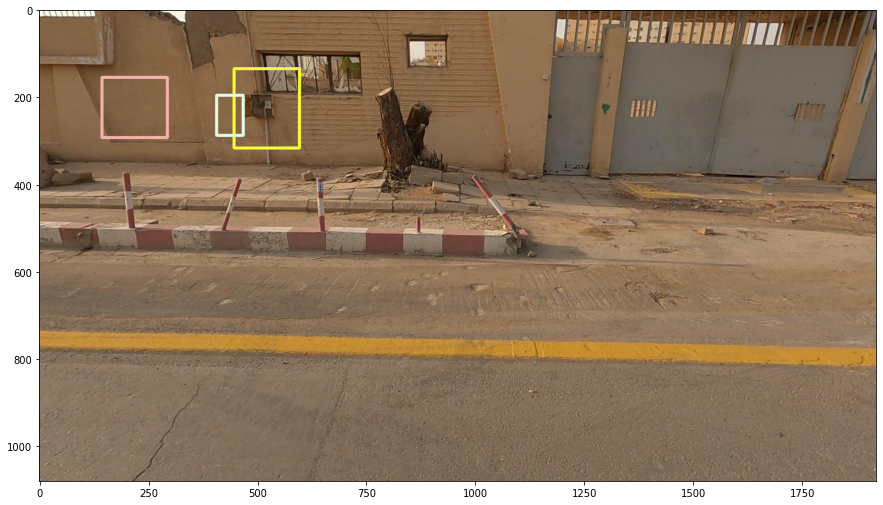

In [ ]:
show_labels('/content/dataset/images/7f43a0b1bc4a16ea8c131ecc65ca83d6.jpg', edit_label=1)


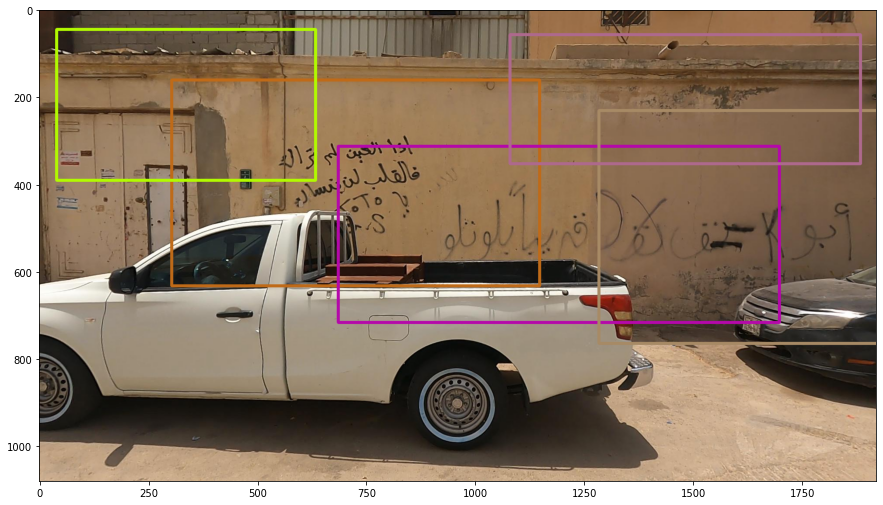

In [ ]:
show_labels('/content/dataset/images/522cafccf5576f5604a2652a0dcf722d.jpg')


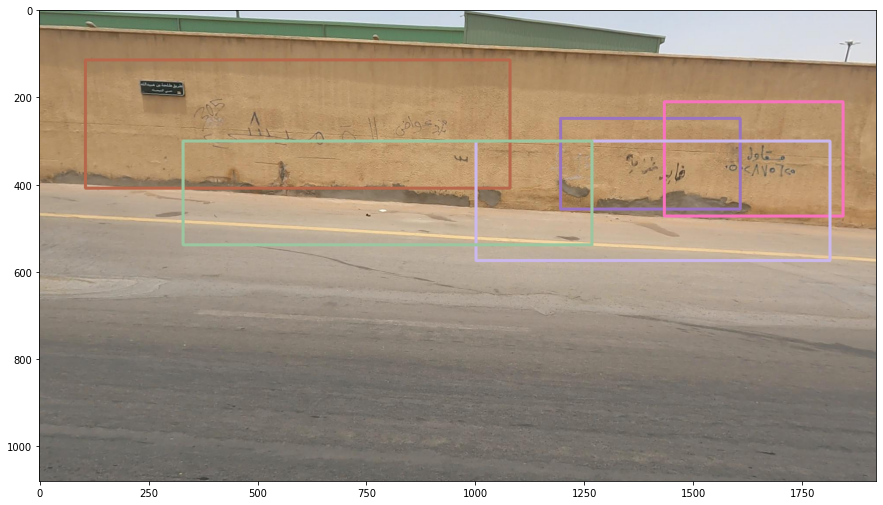

In [ ]:
show_labels('/content/dataset/images/f28ff3dc7b418d864d92851a01de2d27.jpg')


## Save images 

In [ ]:
def save_labels(imgs_path, folder_path='/content/img_saved', edit_label = 2):
    for img_path in imgs_path:
        labels_df = pd.read_csv('/content/dataset/train.csv')
        img_name = img_path.split('/')[-1]
        img_label = labels_df[labels_df['image_path'] == img_name][['name', 'xmax','xmin','ymax', 'ymin']]
        img = cv2.imread(img_path)

        cv2.putText( img, img_label['name'].iloc[0], (100, 1000), cv2.FONT_HERSHEY_SIMPLEX, 
            1, (209, 80, 0, 250), 3)


        for i in range(len(img_label)):
            cv2.rectangle(img, (abs(int(img_label['xmin'].iloc[i]* edit_label)), abs(int(img_label['ymin'].iloc[i]* edit_label))), 
                        (abs(int(img_label['xmax'].iloc[i]* edit_label)), abs(int(img_label['ymax'].iloc[i]* edit_label))),
                        (random.randint(0,255),random.randint(0,255), random.randint(150,255) ), 5)

        cv2.imwrite(os.path.join(folder_path, f'{random.randint(0,100)}_{img_name}'), img)


        # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)



In [ ]:
imgs = ['/content/dataset/images/f28ff3dc7b418d864d92851a01de2d27.jpg', 
        '/content/dataset/images/522cafccf5576f5604a2652a0dcf722d.jpg', 
        '/content/dataset/images/7f43a0b1bc4a16ea8c131ecc65ca83d6.jpg',
        '/content/dataset/images/9b39d91113b05558b5213353a8d1331f.jpg',
        '/content/dataset/images/5b423ae5c1cf5a14010254b708f0203c.jpg',
        '/content/dataset/images/53d3797457a0d2e3afe146e2f797e77e.jpg',
        '/content/dataset/images/1c7d48005a12d1b19261b8e71df7cafe.jpg',
        '/content/dataset/images/4a48c42c9579ec0399e6c5a3e825e765.jpg',
        '/content/dataset/images/ea906a663da6321bcef78be4b7d1afff.jpg']

In [ ]:
save_labels(imgs)

In [ ]:
!mkdir /content/img_saved

In [ ]:
!cp -r /content/img_saved '/content/drive/MyDrive/Job_projects/For Fun'

# Creating Vidoe by Images 

In [ ]:
import uuid
import cv2


In [ ]:
def create_video(parnt_path= '/content/dataset/images', output_path = '/content/img_saved',mode='train', f = 10, edit_label = 2):
    out = cv2.VideoWriter(f'output_video_{uuid.uuid1()}.mp4',cv2.VideoWriter_fourcc(*'MP4V'), f, (1920, 1080))
    # frame = np.zeros((1080, 1920, 3)).astype(np.uint8)*255
    labels_df = pd.read_csv(f'/content/dataset/{mode}.csv')
    imgs_name = labels_df['image_path'].unique()
    for img_name in imgs_name[1000:]:
        img_path = os.path.join(parnt_path, img_name) 
        # img_label = labels_df[labels_df['image_path'] == img_name][['name', 'xmax','xmin','ymax', 'ymin']]
        # frame[:1080, :1940] = cv2.imread(img_path)
        img = cv2.imread(img_path)

        # for i in range(len(img_label)):
        #     color = (random.randint(0,255),random.randint(0,255), random.randint(150,255))
        #     cv2.rectangle(img, (abs(int(img_label['xmin'].iloc[i]* edit_label)), abs(int(img_label['ymin'].iloc[i]* edit_label))), 
        #                 (abs(int(img_label['xmax'].iloc[i]* edit_label)), abs(int(img_label['ymax'].iloc[i]* edit_label))),
        #                 color, 5)
            
        #     cv2.putText( img, img_label['name'].iloc[i], (abs(int(img_label['xmin'].iloc[i]* edit_label)) , 
        #                                                   abs(int(img_label['ymin'].iloc[i]* edit_label))- 10), 
        #                 cv2.FONT_HERSHEY_SIMPLEX, 1, color, 3)

        # cv2.imwrite(os.path.join(output_path, f'{random.randint(0,100)}_{img_name}'), img)

        for i in range(f):
            out.write(img)
        
    out.release()
    




In [ ]:
create_video(mode='test')

In [ ]:
# dir_pipes = glob('/content/data/pipe/dataset/*')
from IPython.display import clear_output
import time
from glob import glob


imgs = glob('/content/dataset/images/*')
for img in imgs:
    clear_output(True)

    boxes = [l['bbox'] for l in annotation_pipe['annotations'] if l['image_id']== img['id']]
    img_dir = '/content/data/pipe/dataset/'+img['file_name']
    img_array = cv2.imread(img_dir)
    for i in boxes:
        cv2.rectangle(img_array, (int(i[0]), int(i[1])), (int(i[2])+int(i[0]), int(i[3]) + int(i[1])), (255, 0, 0), 2 )

    plt.figure(figsize=(7,7))
    plt.imshow(img_array)
    plt.title(img['file_name'])
    plt.show()
    time.sleep(2)

In [ ]:
color = (random.randint(0,255),random.randint(0,255), random.randint(150,255))
color

(85, 113, 174)

In [ ]:
len(labels_df['image_path'].unique())

7874

In [ ]:
!rm -fr /content/img_saved/*

In [ ]:
!rm -fr /content/*.mp4

In [ ]:
labels_test_df = pd.read_csv('/content/dataset/test.csv')
labels_test_df.head() 

,image_path
0,953ab1447c46ecfef67ab14629cd70c7.jpg
1,e4ddbaa7970fca225a51288ce5f7d3f9.jpg
2,5b8120d69607a077b7583334be3ba18b.jpg
3,138b1dc82005b4c33e4886260649d313.jpg
4,0f91ec1533b845b13089f8cf4e0a36f7.jpg


In [ ]:
len(labels_test_df['image_path'].unique())

2092

In [ ]:
!cp /content/output_video_4e09665e-925d-11ed-9003-0242ac1c000c.mp4 '/content/drive/MyDrive/Job_projects/For Fun'

In [ ]:
!cp /content/output_video_4ac7f978-925e-11ed-9003-0242ac1c000c.mp4 '/content/drive/MyDrive/Job_projects/For Fun'

In [ ]:
!cp /content/output_video_f98fc114-9260-11ed-9003-0242ac1c000c.mp4 '/content/drive/MyDrive/Job_projects/For Fun'

# Manipulate the data 

In [ ]:
!cp -r '/content/drive/MyDrive/Job_projects/For Fun/Theme #1' ./ali_data

In [ ]:
!cp -r '/content/drive/MyDrive/Job_projects/For Fun/smart_hackathon_brocken_singage' ./nady_data


In [ ]:
from glob import glob
import shutil
import random
import os

parent_path = '/content/dataset'

os.makedirs(os.path.join(parent_path, 'train', 'images'))
os.makedirs(os.path.join(parent_path, 'train', 'labels'))
os.makedirs(os.path.join(parent_path, 'valid', 'images'))
os.makedirs(os.path.join(parent_path, 'valid', 'labels'))


In [ ]:
os.makedirs(os.path.join('test_data'))


In [ ]:
!cp '/content/ali_data/*/*.zip' /content/test_data

cp: cannot stat '/content/ali_data/*/*.zip': No such file or directory


In [ ]:
# !cp '/content/ali_data/FADED SIGNAGE/FADED SIGNAGE  labels.zip' /content/test_data
!cp '/content/ali_data/UNKEPT_FACADE/UNKEPT_FACADE.zip' /content/test_data
!cp '/content/ali_data/faded2/Faded-signage2.zip' /content/test_data
!cp '/content/ali_data/simple_images/unkept facade2.zip' /content/test_data

In [ ]:
!cp '/content/ali_data/simple_images/unkept facade2 .zip' /content/test_data


In [ ]:
!unzip -q '/content/test_data/Faded-signage2.zip' -d /content/test_data/FADED2

replace /content/test_data/FADED2/train.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
replace /content/test_data/FADED2/obj.data? [y]es, [n]o, [A]ll, [N]one, [r]ename: A


In [ ]:
!rm -fr /content/test_data/UNKEPT2

In [ ]:
from xml.dom import minidom

In [ ]:
unkept_xml = minidom.parse('/content/test_data/UNKEPT/annotations.xml')


In [ ]:
from bs4 import BeautifulSoup 

with open('/content/test_data/UNKEPT/annotations.xml', 'r') as f:
    data = f.read() 

bs_data = BeautifulSoup(data, 'xml') 


In [ ]:
bs_data.find_all('image')[0]

<image height="640" id="0" name="istockphoto-1010780802-612x612.jpg" width="640">
</image>

In [ ]:
bs_data.find_all('image')[0].find_all('box')


[]

In [ ]:
bs_data.find_all('image')[1]

<image height="640" id="1" name="istockphoto-1011313054-612x612.jpg" width="640">
<box label="unkept facade" occluded="0" source="manual" xbr="592.64" xtl="308.20" ybr="246.96" ytl="13.78" z_order="0">
</box>
<box label="unkept facade" occluded="0" source="manual" xbr="584.74" xtl="314.12" ybr="624.15" ytl="254.77" z_order="0">
</box>
</image>

In [ ]:
bs_data.find_all('image')[1].find_all('box')[0]

<box label="unkept facade" occluded="0" source="manual" xbr="592.64" xtl="308.20" ybr="246.96" ytl="13.78" z_order="0">
</box>

In [ ]:
bs_data.find_all('image')[1].get('name')

'istockphoto-1011313054-612x612.jpg'

In [ ]:
from bs4 import BeautifulSoup 
import numpy as np

def write_in_file(info, file_name='id_0'):
    try:
        writer = open(f'{file_name}.txt', 'w')
        for text in info:
            writer.write(text + '\n')
    except Exception as e:
        raise e
    else:
        writer.close()

def convert_xml2yolo(file_path='/content/test_data/UNKEPT/annotations.xml', output_path='/content/test_data/UNKEPT', index_label=10):
    with open(file_path, 'r') as f:
        data = f.read() 
        f.close()

    bs_data = BeautifulSoup(data, 'xml') 

    labels = bs_data.find_all('image')
    for label in labels:
        boxes = label.find_all('box')
        im_h, im_w = int(label.get('height')), int(label.get('width'))
        info = []
        if len(boxes) > 0:
            for box in boxes:
                x1,y1 , x2,y2 = box.get('xtl'), box.get('ytl'), box.get('xbr'), box.get('ybr')
                x1,y1 , x2,y2 = float(x1), float(y1), float(x2), float(y2)

                xc, yc, w,h = (x1+((x2-x1)/2))/im_w, (y1+((y2-y1)/2))/im_h, (x2-x1)/im_w, (y2-y1)/im_h

                info.append(f'{index_label} {xc} {yc} {w} {h}')
        if len(info) != 0:  
            try:   
                
                # shutil.copy(file_path, f'/content/data/final_data/{split_type}/images/{img_id}.jpg')
                img_id = label.get('name').split('.')[0]
                write_in_file(info, f'{output_path}/{img_id}')
                print(f'{label.get("id")} add {img_id}')

            except Exception as e:
                print(e)
        else:
            print('we can\'t create empty text')



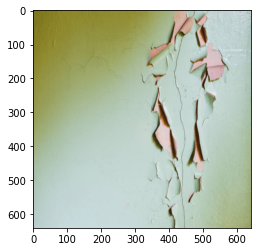

In [ ]:
plt.imshow(plt.imread('/content/ali_data/UNKEPT_FACADE/istockphoto-1011313054-612x612.jpg'))

In [ ]:
cv2.rectangle

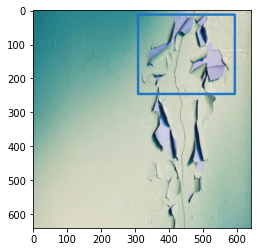

In [ ]:
img = cv2.imread('/content/ali_data/UNKEPT_FACADE/istockphoto-1011313054-612x612.jpg')
box = bs_data.find_all('image')[1].find_all('box')
x1,y1 , x2,y2 = box[0].get('xtl'), box[0].get('ytl'), box[0].get('xbr'), box[0].get('ybr')
cv2.rectangle(img, (int(float(x1)), int(float(y1))), 
                    (int(float(x2)), int(float(y2))),
                    (random.randint(0,255),random.randint(0,255), random.randint(150,255) ), 5)
plt.imshow(img)

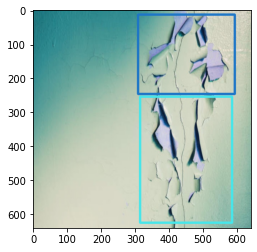

In [ ]:
box = bs_data.find_all('image')[1].find_all('box')
x1,y1 , x2,y2 = box[1].get('xtl'), box[1].get('ytl'), box[1].get('xbr'), box[1].get('ybr')
cv2.rectangle(img, (int(float(x1)), int(float(y1))), 
                    (int(float(x2)), int(float(y2))),
                    (random.randint(0,255),random.randint(0,255), random.randint(150,255) ), 5)
plt.imshow(img)

In [ ]:
x1, x2 = int(float(x1)), int(float(x2))
(x1+((x2-x1)/2))/int(bs_data.find_all('image')[1].get('width'))

0.7015625

In [ ]:
x1, x2 = int(float(x1)), int(float(x2))
(((x2-x1)/2))/int(bs_data.find_all('image')[1].get('width'))

0.2109375

In [ ]:
450/640

0.703125

In [ ]:
convert_xml2yolo(file_path='/content/test_data/UNKEPT/annotations.xml', output_path='/content/test_data/UNKEPT', index_label=10)

we can't create empty text
1 add istockphoto-1011313054-612x612
2 add istockphoto-1024299094-612x612
3 add istockphoto-1035414506-612x612
4 add istockphoto-1049255836-612x612
5 add istockphoto-1065423790-612x612
6 add istockphoto-1083843112-612x612
7 add istockphoto-1086026922-612x612
8 add istockphoto-1130381234-612x612
9 add istockphoto-1134931747-612x612
10 add istockphoto-1137442133-612x612
11 add istockphoto-1139267479-612x612
12 add istockphoto-1141602915-2048x2048
14 add istockphoto-1144988055-2048x2048
15 add istockphoto-1145707630-612x612
16 add istockphoto-1148975195-612x612
17 add istockphoto-1153601475-612x612
18 add istockphoto-1164677319-612x612
20 add istockphoto-1165735782-612x612
21 add istockphoto-117217184-612x612
22 add istockphoto-1177762835-612x612
23 add istockphoto-1177764481-612x612
24 add istockphoto-1179937747-612x612
25 add istockphoto-1186921844-612x612
26 add istockphoto-1192647889-612x612
27 add istockphoto-1202336306-612x612
28 add istockphoto-1207629327

In [ ]:
convert_xml2yolo(file_path='/content/test_data/FADED/annotations.xml', output_path='/content/test_data/FADED', index_label=1)

0 add FADED SIGNAGE in street_127
1 add FADED SIGNAGE in street_128
2 add FADED SIGNAGE in street_129
3 add FADED SIGNAGE in street_130
4 add FADED SIGNAGE in street_131
5 add FADED SIGNAGE in street_132
6 add FADED SIGNAGE in street_134
7 add FADED SIGNAGE in street_135
8 add FADED SIGNAGE in street_136
9 add FADED SIGNAGE in street_137
10 add FADED SIGNAGE in street_138
11 add FADED SIGNAGE in street_139
12 add FADED SIGNAGE in street_140
13 add FADED SIGNAGE in street_141
14 add FADED SIGNAGE in street_143
15 add FADED SIGNAGE in street_144
16 add FADED SIGNAGE in street_145
17 add FADED SIGNAGE in street_146
18 add FADED SIGNAGE in street_147
19 add FADED SIGNAGE in street_149
20 add FADED SIGNAGE in street_150
21 add FADED SIGNAGE in street_151
22 add FADED SIGNAGE in street_152
23 add FADED SIGNAGE in street_153
24 add FADED SIGNAGE in street_154
25 add FADED SIGNAGE in street_155
26 add FADED SIGNAGE in street_156
27 add FADED SIGNAGE in street_157
28 add FADED SIGNAGE in street

In [ ]:
!rm -fr /content/test_data/FADED/*.txt

In [ ]:
def change_label_index(index_label, path= '/content/test_data/FADED2/obj_train_data/*.txt'):
    labels = glob(path)
    for label in labels:
        new_lines = []
        with open(label, 'r') as f:
            lines = f.readlines() 
            f.close()
        for line in lines:

            l_split = line.split(' ')
            l_split[0] = str(index_label)

            line = ' '.join(l_split)
            new_lines.append(line)
        with open(label, 'w') as writer:
            for text in new_lines:
                writer.write(text)
        
        print(label)

In [ ]:
change_label_index(index_label=1,path= '/content/test_data/FADED2/obj_train_data/*.txt')

/content/test_data/FADED2/obj_train_data/istockphoto-1137812142-612x612.txt
/content/test_data/FADED2/obj_train_data/istockphoto-181411818-612x612.txt
/content/test_data/FADED2/obj_train_data/istockphoto-522388594-612x612.txt
/content/test_data/FADED2/obj_train_data/istockphoto-953157444-612x612.txt
/content/test_data/FADED2/obj_train_data/istockphoto-1299323585-612x612.txt
/content/test_data/FADED2/obj_train_data/istockphoto-118913754-612x612.txt
/content/test_data/FADED2/obj_train_data/istockphoto-1318427859-612x612.txt
/content/test_data/FADED2/obj_train_data/istockphoto-880556880-612x612.txt
/content/test_data/FADED2/obj_train_data/istockphoto-1077743378-612x612 (1).txt
/content/test_data/FADED2/obj_train_data/istockphoto-1214556996-612x612.txt
/content/test_data/FADED2/obj_train_data/istockphoto-901754636-612x612.txt
/content/test_data/FADED2/obj_train_data/istockphoto-182882015-612x612.txt
/content/test_data/FADED2/obj_train_data/istockphoto-1138074661-612x612.txt
/content/test_d

In [ ]:
change_label_index(index_label=10,path= '/content/test_data/UNKEPT21/obj_train_data/*.txt')


/content/test_data/UNKEPT21/obj_train_data/imagenbn.txt
/content/test_data/UNKEPT21/obj_train_data/istockphoto-546795830-612x612.txt
/content/test_data/UNKEPT21/obj_train_data/istockphoto-610240442-612x612.txt
/content/test_data/UNKEPT21/obj_train_data/istockphoto-481891668-612x612.txt
/content/test_data/UNKEPT21/obj_train_data/istockphoto-848703260-612x612.txt
/content/test_data/UNKEPT21/obj_train_data/istockphoto-183025118-612x612 (1).txt
/content/test_data/UNKEPT21/obj_train_data/istockphoto-893459890-612x612.txt
/content/test_data/UNKEPT21/obj_train_data/istockphoto-1410626105-612x612.txt
/content/test_data/UNKEPT21/obj_train_data/i.txt
/content/test_data/UNKEPT21/obj_train_data/istockphoto-512117958-612x612.txt
/content/test_data/UNKEPT21/obj_train_data/istockphoto-1081697042-612x612.txt
/content/test_data/UNKEPT21/obj_train_data/istockphoto-148795106-612x612.txt
/content/test_data/UNKEPT21/obj_train_data/istockphoto-929764514-612x612.txt
/content/test_data/UNKEPT21/obj_train_data

In [ ]:
change_label_index(index_label=5,path= '/content/test_data/obj_train_data/*.txt')


/content/test_data/obj_train_data/brokenstreetsignage192.txt
/content/test_data/obj_train_data/brokenstreetsignage15.txt
/content/test_data/obj_train_data/brokenstreetsignage17.txt
/content/test_data/obj_train_data/brokenstreetsignage9.txt
/content/test_data/obj_train_data/brokenstreetsignage174.txt
/content/test_data/obj_train_data/brokenstreetsignage13.txt
/content/test_data/obj_train_data/brokenstreetsignage19.txt
/content/test_data/obj_train_data/brokenstreetsignage36.txt
/content/test_data/obj_train_data/falldownstreetsignage284.txt
/content/test_data/obj_train_data/brokenstreetsignage175.txt
/content/test_data/obj_train_data/brokenstreetsignage108.txt
/content/test_data/obj_train_data/brokenstreetsignage69.txt
/content/test_data/obj_train_data/brokenstreetsignage182.txt
/content/test_data/obj_train_data/brokenstreetsignage43.txt
/content/test_data/obj_train_data/brokenstreetsignage23.txt
/content/test_data/obj_train_data/falldownstreetsignage64.txt
/content/test_data/obj_train_da

In [ ]:
!cp -r /content/nady_data/*/obj_train_data /content/test_data

In [ ]:
!ls /content/test_data/obj_train_data/* | wc -l

109


In [ ]:
!ls /content/nady_data/*/obj_train_data/*.txt | wc -l

109


In [ ]:
# !mkdir -p /content/nady_data2/train/labels
!mkdir -p /content/nady_data2/train/images


In [ ]:
!cp /content/test_data/obj_train_data/* /content/nady_data2/train/labels

In [ ]:
!cp /content/nady_data/*/img/* /content/nady_data2/train/images

In [ ]:
# !rm -fr /content/nady_data/*/obj_train_data/*.txt

In [ ]:
# !cp /content/nady_data2/train/images/* /content/dataset/train/images
!cp /content/nady_data2/train/labels/* /content/dataset/train/labels


In [ ]:
!cp /content/test_data/FADED/*.txt /content/dataset/train/labels
!cp /content/test_data/FADED2/obj_train_data/* /content/dataset/train/labels
!cp /content/test_data/UNKEPT/* /content/dataset/train/labels
!cp /content/test_data/UNKEPT21/obj_train_data/* /content/dataset/train/labels

In [ ]:
!ls /content/dataset/train/labels/* | wc -l

461


In [ ]:
!cp /content/ali_data/*/*.jp*g /content/dataset/train/images

In [ ]:
!ls /content/ali_data/*/*.jp*g | wc -l

348


In [ ]:
!ls /content/dataset/train/images/* | wc -l

425


In [ ]:
!zip -r dataset_mosa.zip dataset

In [ ]:
!cp /content/dataset_mosa.zip '/content/drive/MyDrive/Job_projects/For Fun/'

In [ ]:
import pandas as pd
import cv2
import numpy as np


def convert_y2xy(l, im_w, im_h):
    # print(np.array(l.split(' '), np.float32))
    c, xc, yc, w,h = np.array(l.split(' '), np.float32)
    c, x1,y1, x2,y2  = np.array([c, (xc-(w/2))*im_w, (yc-(h/2))*im_h, (xc+(w/2))*im_w, (yc+(h/2))*im_h], np.int32)
    return c, (x1,y1), (x2,y2)


def create_csv_from_yolo():

    # 10.0 UNKEPT_FACADE, 5.0 BROKEN_SIGNAGE, 1.0 FADED_SIGNAGE
    cls = {1: 'FADED_SIGNAGE', 5: 'BROKEN_SIGNAGE', 10: 'UNKEPT_FACADE'}
    df = pd.DataFrame({}, columns =['class', 'image_path', 'name', 'xmax', 'xmin', 'ymax', 'ymin'])
        
    t_imgs = glob('/content/dataset/train/images/*')
    t_labels = glob('/content/dataset/train/labels/*')

    for l in t_labels:
        pth_split = l.split('/')
        img = '/'.join(pth_split[:-2]+ ['images', f'{pth_split[-1][:-4]}.jpg'])

        label_id = pth_split[-1][:-4]
        id_flag = False
        im_base = ''
        img_path = ''
        for im in t_imgs:
            im_id = os.path.basename(im)
            if im_id.split('.')[0] == label_id:
                id_flag = True
                im_base = im_id
                img_path = im
                break
        if id_flag:      
            im_h, im_w = cv2.imread(img_path).shape[:-1]

            with open(l, 'r') as f:
                lines = f.readlines()
                f.close()

            df2 = []
            for line in lines:
                c, (x1,y1), (x2,y2) = convert_y2xy(line, im_w, im_h)

                df2.append({'class': c, 'image_path': im_base, 'name': cls[c],
                    'xmax': x2, 'xmin':x1, 'ymax':y2, 'ymin':y1})
            df = df.append(df2, ignore_index = True)

        else:
            print('img', label_id,  'is not exist')

    return df

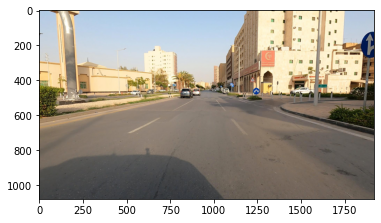

In [ ]:
plt.imshow(plt.imread('/content/data_spliting/classes/BAD_BILLBOARD/000ed1547634a24f09f22530065d46c9.jpg'))


In [ ]:
plt.imread('/content/data_spliting/classes/BAD_BILLBOARD/000ed1547634a24f09f22530065d46c9.jpg').shape

(1080, 1920, 3)

In [ ]:
df = pd.DataFrame({}, columns =['class', 'image_path', 'name', 'xmax', 'xmin', 'ymax', 'ymin'])
df.head()

,class,image_path,name,xmax,xmin,ymax,ymin


In [ ]:
df2 = [{'class': 0, 'image_path': 'momom', 'name': 'momfd',
                   'xmax': 5, 'xmin':1, 'ymax':5, 'ymin':2},
       {'class': 0, 'image_path': 'momom', 'name': 'momfd',
                   'xmax': 5, 'xmin':1, 'ymax':5, 'ymin':2}]
df = df.append(df2, ignore_index = True)
df.head()

,class,image_path,name,xmax,xmin,ymax,ymin
0,0,momom,momfd,5,1,5,2
1,0,momom,momfd,5,1,5,2
2,0,momom,momfd,5,1,5,2


In [ ]:
df = create_csv_from_yolo()
df.head()

In [ ]:
!cat '/content/dataset/train/labels/FADED SIGNAGE in street_256.txt'

1 0.29667968749999996 0.37153125 0.4012343749999999 0.5972187499999999


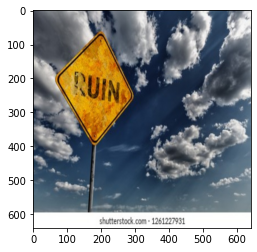

In [ ]:
plt.imshow(plt.imread('/content/dataset/train/images/FADED SIGNAGE in street_256.jpeg'))


In [ ]:
os.path.basename('/content/dataset/train/images/FADED SIGNAGE in street_256.jpeg').split('.')[0] == 'FADED SIGNAGE in street_256'

True

In [ ]:
df.to_csv('/content/dataset/train/annotaion_mosa.csv')

In [ ]:
!zip -r dataset_mosa.zip dataset 

In [ ]:
!cp dataset_mosa.zip '/content/drive/MyDrive/Job_projects/For Fun/dataset_mosa.zip'

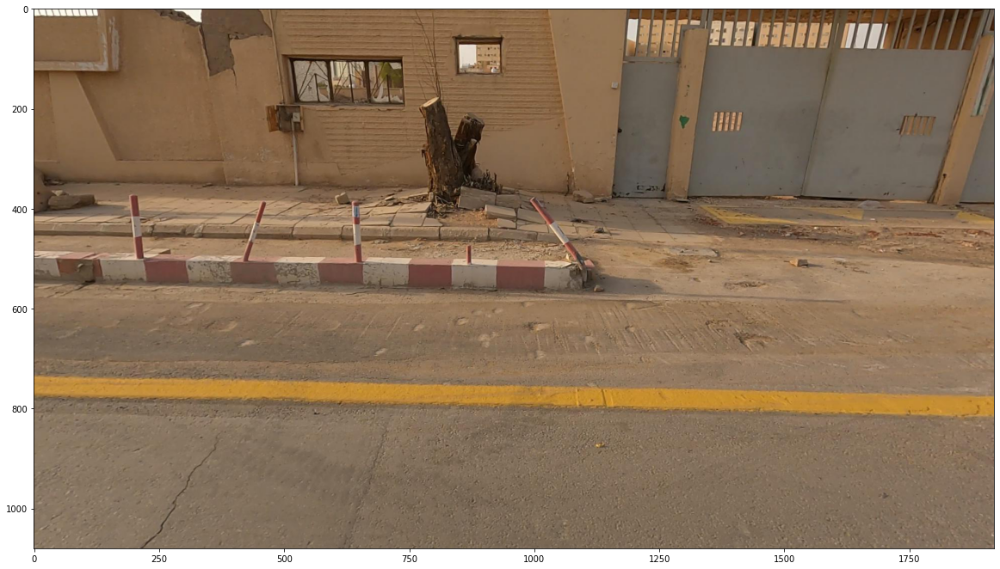

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(plt.imread('/content/data/dataset/images/7f43a0b1bc4a16ea8c131ecc65ca83d6.jpg'))

In [ ]:
df = pd.read_csv('/content/data/dataset/train.csv')
df.head()

,class,image_path,name,xmax,xmin,ymax,ymin
0,3.0,4a48c42c9579ec0399e6c5a3e825e765.jpg,GARBAGE,797.0,701.0,262.0,211.0
1,3.0,4a48c42c9579ec0399e6c5a3e825e765.jpg,GARBAGE,932.0,786.0,329.0,238.0
2,3.0,4a48c42c9579ec0399e6c5a3e825e765.jpg,GARBAGE,736.0,657.0,275.0,229.0
3,7.0,ea906a663da6321bcef78be4b7d1afff.jpg,BAD_BILLBOARD,986.0,786.0,136.0,0.0
4,8.0,1c7d48005a12d1b19261b8e71df7cafe.jpg,SAND_ON_ROAD,667.0,549.0,228.0,179.0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19950 entries, 0 to 19949
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   class       19950 non-null  float64
 1   image_path  19950 non-null  object 
 2   name        19950 non-null  object 
 3   xmax        19950 non-null  float64
 4   xmin        19950 non-null  float64
 5   ymax        19950 non-null  float64
 6   ymin        19950 non-null  float64
dtypes: float64(5), object(2)
memory usage: 1.1+ MB


In [ ]:
df[['xmax','xmin','ymax', 'ymin']] = abs(df[['xmax','xmin','ymax', 'ymin']])
df.head()

,class,image_path,name,xmax,xmin,ymax,ymin
0,3.0,4a48c42c9579ec0399e6c5a3e825e765.jpg,GARBAGE,1594.0,1402.0,524.0,422.0
1,3.0,4a48c42c9579ec0399e6c5a3e825e765.jpg,GARBAGE,1864.0,1572.0,658.0,476.0
2,3.0,4a48c42c9579ec0399e6c5a3e825e765.jpg,GARBAGE,1472.0,1314.0,550.0,458.0
3,7.0,ea906a663da6321bcef78be4b7d1afff.jpg,BAD_BILLBOARD,1972.0,1572.0,272.0,0.0
4,8.0,1c7d48005a12d1b19261b8e71df7cafe.jpg,SAND_ON_ROAD,1334.0,1098.0,456.0,358.0


In [ ]:
df

,class,image_path,name,xmax,xmin,ymax,ymin
0,3.0,4a48c42c9579ec0399e6c5a3e825e765.jpg,GARBAGE,1594.0,1402.0,524.0,422.0
1,3.0,4a48c42c9579ec0399e6c5a3e825e765.jpg,GARBAGE,1864.0,1572.0,658.0,476.0
2,3.0,4a48c42c9579ec0399e6c5a3e825e765.jpg,GARBAGE,1472.0,1314.0,550.0,458.0
3,7.0,ea906a663da6321bcef78be4b7d1afff.jpg,BAD_BILLBOARD,1972.0,1572.0,272.0,0.0
4,8.0,1c7d48005a12d1b19261b8e71df7cafe.jpg,SAND_ON_ROAD,1334.0,1098.0,456.0,358.0
...,...,...,...,...,...,...,...
19945,4.0,081e7bb3832ec5bb25276db161a96274.jpg,CONSTRUCTION_ROAD,2050.0,1200.0,816.0,296.0
19946,2.0,1ff38a7af7f13b1201d17c6e1829373a.jpg,POTHOLES,1314.0,836.0,728.0,564.0
19947,2.0,1ff38a7af7f13b1201d17c6e1829373a.jpg,POTHOLES,1014.0,676.0,872.0,566.0
19948,7.0,ac97490f13140fc1bfe613ec69301b34.jpg,BAD_BILLBOARD,1912.0,1426.0,220.0,50.0


In [ ]:
df.iloc[18994]

class                                         10.0
image_path    adda6004228b263c5af6ccd7046d6f0f.jpg
name                                 UNKEPT_FACADE
xmax                                         228.0
xmin                                          50.0
ymax                                         478.0
ymin                                         244.0
Name: 18994, dtype: object

In [ ]:
parent_path = '/content/data/dataset2'

os.makedirs(os.path.join(parent_path, 'train', 'images'))
os.makedirs(os.path.join(parent_path, 'train', 'labels'))
os.makedirs(os.path.join(parent_path, 'valid', 'images'))
os.makedirs(os.path.join(parent_path, 'valid', 'labels'))

In [ ]:

os.makedirs(os.path.join('/content/data/dataset2', 'detect', 'images'))

In [ ]:
from random import shuffle
from glob import glob
import shutil

labels_df = pd.read_csv('/content/data/dataset/train.csv')

labels_df[['xmax','xmin','ymax', 'ymin']] = abs(labels_df[['xmax','xmin','ymax', 'ymin']] * 2)


def write_in_file(info, file_name='id_0'):
    try:
        writer = open(f'{file_name}.txt', 'w')
        for text in info:
            writer.write(text + '\n')
    except Exception as e:
        raise e
    else:
        writer.close()

def get_label(img_path, mode='train'):
    
    img_name = img_path.split('/')[-1]
    img_label = labels_df[labels_df['image_path'] == img_name][['class', 'xmax','xmin','ymax', 'ymin']]
    img_h, img_w = cv2.imread(img_path).shape[:-1]
    
    info = []
    parant_img_path = f'/content/data/dataset2/{mode}/images'
    parant_l_path = f'/content/data/dataset2/{mode}/labels'

    for i in range(len(img_label)):
        c, x1,y1 , x2,y2 = int(img_label['class'].iloc[i]), img_label['xmin'].iloc[i],img_label['ymin'].iloc[i] , img_label['xmax'].iloc[i],img_label['ymax'].iloc[i]
        
        xc,yc , w,h = (x1+((x2-x1)/2))/img_w, (y1+((y2-y1)/2))/img_h, (x2-x1)/img_w, (y2-y1)/img_h

        info.append(f'{c} {xc} {yc} {w} {h}')
    

    if len(info) != 0:  
            try:   

                img_id = img_name.split('.')[0] 
                shutil.copy(img_path, f'{parant_img_path}/{img_id}.jpg')
                write_in_file(info, f'{parant_l_path}/{img_id}')

                print('Done : ', img_path)

            except Exception as e:
                print(e)
    else:
        print('we can\'t create empty text')


def get_labels():
    
    imgs_path = glob('/content/data/dataset/images/*') 
    shuffle(imgs_path)

    for img in imgs_path[:int(len(imgs_path)*0.8)]:
        get_label(img)

    for img in imgs_path[int(len(imgs_path)*0.8):]:
        get_label(img, mode='valid')

        
        





In [ ]:
get_labels()

Streaming output truncated to the last 5000 lines.
Done :  /content/data/dataset/images/e0f87f2e41f32ee9617f2da9f70c8aed.jpg
Done :  /content/data/dataset/images/33e9840a4fdc78f10ef92fe955079e3f.jpg
Done :  /content/data/dataset/images/df97bd97b65871447ad24b6aa055f1f7.jpg
Done :  /content/data/dataset/images/9f3932f0da923f1e0586e8aaccd56a27.jpg
Done :  /content/data/dataset/images/4e8046469cd0899d5cea28e159a23563.jpg
Done :  /content/data/dataset/images/90b6fef7b840e1f6608d16947f8ed808.jpg
Done :  /content/data/dataset/images/6f09f2442a6e6658df7053a656e679ec.jpg
we can't create empty text
Done :  /content/data/dataset/images/97e6decbb51fe0cf06ec318857e3c376.jpg
Done :  /content/data/dataset/images/af1320e3aec64c15193f757d1e762a3f.jpg
Done :  /content/data/dataset/images/28f3b194f9b885d0f5545f4e881747e1.jpg
Done :  /content/data/dataset/images/1755bd9ee66eee1171260f9c5627caa9.jpg
Done :  /content/data/dataset/images/3f187b5cb75a7bfa9c3da7a3cfc3b912.jpg
Done :  /content/data/dataset/imag

In [ ]:
import numpy as np
def convert_y2xy(l, im_w, im_h):
    c, xc, yc, w,h = np.array(l.split(' '), np.float32)
    c, x1,y1, x2,y2  = np.array([c, (xc-(w/2))*im_w, (yc-(h/2))*im_h, (xc+(w/2))*im_w, (yc+(h/2))*im_h], np.int32)
    return c, (x1,y1), (x2,y2)


def show_labels(img_path):
    path_split = img_path.split('/')
    img_name = path_split[-1]
    label_path = '/'.join(path_split[:-2]) + '/labels/'+ '.'.join(path_split[-1].split('.')[:-1]) + '.txt'
    img = cv2.imread(img_path)
    im_h, im_w = img.shape[:-1]
    color = (random.randint(0,255),random.randint(0,255), random.randint(150,255))


    with open(label_path, 'r') as f:
        lines = f.readlines()
        f.close()
    for l in lines:

        c, (x1,y1), (x2,y2) = convert_y2xy(l, im_w, im_h)
        cv2.putText( img, str(c), (x1, y1-10), 
                        cv2.FONT_HERSHEY_SIMPLEX, 1, color, 3)

        cv2.rectangle(img, (x1, y1), (x2, y2),
                      color, 5)


    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(15,10))
    plt.imshow(img)
    plt.show()
        



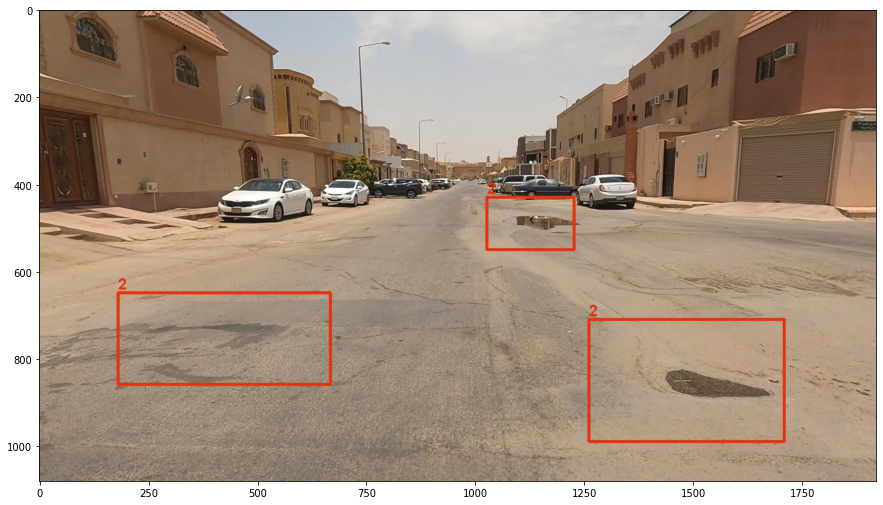

In [ ]:
show_labels('/content/data/dataset2/train/images/3b393b144237b3054d64a60583aad647.jpg')

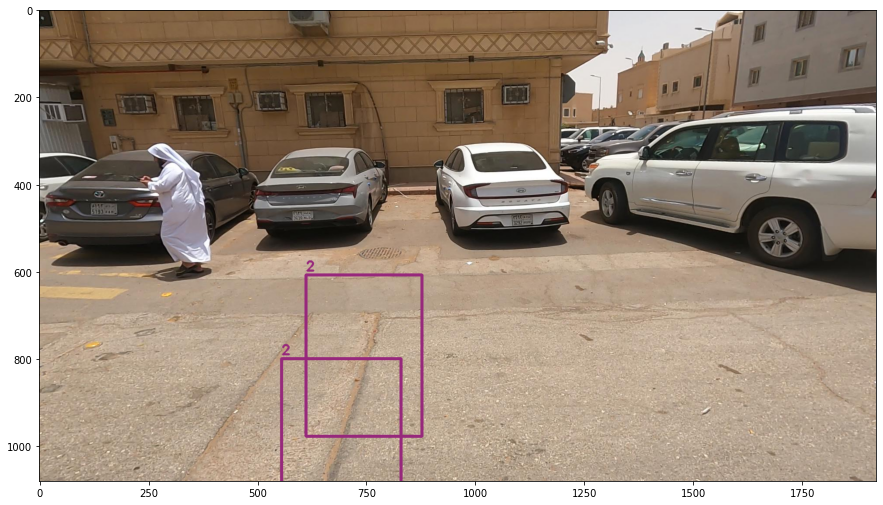

In [ ]:
show_labels('/content/data/dataset2/valid/images/3fde2773aaf19960cd6aa657b76b5bdb.jpg')

In [ ]:
# !rm -fr /content/data/dataset2/*

In [ ]:
%cd /content/data

/content/data


In [ ]:
!zip -r dataset_mosa.zip dataset2 

Streaming output truncated to the last 5000 lines.
updating: dataset2/valid/images/02533dafc548f483ce858ce385dfba6b.jpg (deflated 1%)
updating: dataset2/valid/images/686f4df7cc676bccaef56b8a7a637364.jpg (deflated 0%)
updating: dataset2/valid/images/467758955ec29fa2475ef6887c29b751.jpg (deflated 0%)
updating: dataset2/valid/images/81368b0a4a9cc5a3e1743dc83d17457e.jpg (deflated 0%)
updating: dataset2/valid/images/80177c8419e0cc092c3875753bbc3860.jpg (deflated 1%)
updating: dataset2/valid/images/6f3138ba5f52d9f0b10021af1810a01d.jpg (deflated 1%)
updating: dataset2/valid/images/8b0f8daf6445bb4d5cbf711e17af2346.jpg (deflated 1%)
updating: dataset2/valid/images/8e62901be7b8aac090dffab578e6b040.jpg (deflated 1%)
updating: dataset2/valid/images/d281522492d480e78d9613fd9b1184d3.jpg (deflated 2%)
updating: dataset2/valid/images/a5a01146918047999990ff7c9800e89d.jpg (deflated 1%)
updating: dataset2/valid/images/ea535a7948207bb5f4b9bb7b4650d636.jpg (deflated 0%)
updating: dataset2/valid/images/0723

In [ ]:
img_test = pd.read_csv('/content/data/dataset/test.csv')

img_test = list(img_test['image_path'].unique())
for img in img_test:
    shutil.copy(f'/content/data/dataset/images/{img}', '/content/data/dataset2/detect/images')

In [ ]:
!ls /content/data/dataset2/detect/images/* | wc -l

2092


In [ ]:
!cp /content/dataset_mosa.zip '/content/drive/MyDrive/Job_projects/For Fun/'

In [ ]:
!cat /content/data/dataset2/train/labels/079c450d12649c8c9563e8c7f7e7193f.txt

10 0.6260416666666667 0.3314814814814815 1.0583333333333333 0.45925925925925926


In [ ]:
%cd ..

/content


In [ ]:
!cp '/content/drive/MyDrive/Job_projects/For Fun/dataset_mosa3.zip' .

In [ ]:
!unzip dataset_mosa3.zip

In [ ]:
!cp /content/dataset/valid/images/* /content/data/dataset2/valid/images
!cp /content/dataset/valid/labels/* /content/data/dataset2/valid/labels
!cp /content/dataset/train/images/* /content/data/dataset2/train/images
!cp /content/dataset/train/labels/* /content/data/dataset2/train/labels


In [ ]:
# !rm -fr /content/dataset

In [ ]:
!cp -r /content/data/dataset2 .

In [ ]:
!mv /content/dataset2 /content/dataset

In [ ]:
!zip -r dataset_mosa.zip dataset

Streaming output truncated to the last 5000 lines.
  adding: dataset/detect/images/e09f8936d5b62c2c4cf234bc2e9395f4.jpg (deflated 1%)
  adding: dataset/detect/images/876e7277e3fb83d8f87a201c2f25ccb6.jpg (deflated 1%)
  adding: dataset/detect/images/04df27bdf59becdb480d4398536abd35.jpg (deflated 0%)
  adding: dataset/detect/images/3bc7cdee582cfae76ee88011d5da2a1a.jpg (deflated 2%)
  adding: dataset/detect/images/c19ddf64e1ae55c8267617b9c1e2e87e.jpg (deflated 1%)
  adding: dataset/detect/images/ee17aaaa415a229b3e574d5b6e6ca3fa.jpg (deflated 1%)
  adding: dataset/detect/images/db8129fa0b9f60020d45eaebbf1caf08.jpg (deflated 0%)
  adding: dataset/detect/images/3de30c56414ce72d068eafc1632165d0.jpg (deflated 1%)
  adding: dataset/detect/images/b5d1a4e8c521bf8124e1e2432d3617e5.jpg (deflated 1%)
  adding: dataset/detect/images/0c368cabaf2d03fa161610701da7f3ae.jpg (deflated 0%)
  adding: dataset/detect/images/46627c685bb829f53679987362f975be.jpg (deflated 1%)
  adding: dataset/detect/images/ae34

# Upload data on Kaggle

In [ ]:
import os

def connect_with_kaggle(kggle_user, kaggle_key):
    os.makedirs('/root/.kaggle') 
    my_api = '{"username":"'+ kggle_user +'","key":"'+ kaggle_key +'"}'
    with open('/root/.kaggle/kaggle.json', 'w') as f:
        f.write(my_api)
        f.close()
    print(os.listdir('/root/.kaggle'))

connect_with_kaggle(kggle_user='mo7amedmosa', kaggle_key='da5c72bd80439b6ea3b8172334eabca5')

['kaggle.json']


In [ ]:
!kaggle datasets init -p /content/dataset 

Data package template written to: /content/dataset/dataset-metadata.json


In [ ]:
!kaggle datasets create --dir-mode tar -p /content/dataset


Starting upload for file train.tar
100% 1.47G/1.47G [00:13<00:00, 116MB/s]
Upload successful: train.tar (1GB)
Starting upload for file detect.tar
100% 475M/475M [00:04<00:00, 112MB/s]
Upload successful: detect.tar (475MB)
Starting upload for file valid.tar
100% 364M/364M [00:03<00:00, 110MB/s]
Upload successful: valid.tar (364MB)
Your private Dataset is being created. Please check progress at https://www.kaggle.com/datasets/mo7amedmosa/street-imagery
